In [1]:
import os
import glob
import numpy as np
import xarray as xr

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
%matplotlib inline
import matplotlib
matplotlib.rcParams.update({'font.size':15})
import time
import cartopy.crs as ccrs
import cartopy
CMIP6_FOLDER = "/global/cfs/projectdirs/m3522/cmip6/"
SCRATCH="/pscratch/sd/q/qnicolas/"

import sys
p = os.path.abspath('/global/homes/q/qnicolas/')
if p not in sys.path:
    sys.path.append(p)

from tools.generalTools import *; from tools.BLtools import *; from tools.e5tools import *
from tropicalOrographicRegions.mountainUtils import tilted_rect

from scipy.stats import linregress
#xr.set_options(display_style='text') 

from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from matplotlib.legend_handler import HandlerLine2D
import matplotlib.lines
from scipy.ndimage import gaussian_filter

plt.rcParams['hatch.color'] = 'w'

%load_ext autoreload
%autoreload 2

/global/common/software/m3310/conda/xrdask.2024.03.qn/lib/python3.11/site-packages/pyproj/__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()


# Data

In [2]:
import dask
from dask.distributed import Client, LocalCluster

dask.config.config["distributed"]["dashboard"]["link"] = "{JUPYTERHUB_SERVICE_PREFIX}proxy/{host}:{port}/status"

client = Client(n_workers=8,threads_per_worker=1,memory_limit='10G')
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/qnicolas/perlmutter-login-node-base/proxy/127.0.0.1:8787/status,
Dashboard: /user/qnicolas/perlmutter-login-node-base/proxy/127.0.0.1:8787/status,Workers: 8
Total threads: 8,Total memory: 74.51 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:42823,Workers: 8
Dashboard: /user/qnicolas/perlmutter-login-node-base/proxy/127.0.0.1:8787/status,Total threads: 8
Started: Just now,Total memory: 74.51 GiB
Comm: tcp://127.0.0.1:35917,Total threads: 1
Dashboard: /user/qnicolas/perlmutter-login-node-base/proxy/127.0.0.1:40873/status,Memory: 9.31 GiB
Nanny: tcp://127.0.0.1:33143,


In [3]:
def sel_box_months(var,box,months,lon='longitude',lat='latitude',lat_increase=False):
    window = sel_box(var,box,lon,lat,lat_increase)
    window=sel_months(window,months)
    return window

def add_wind(ax,u,v,color='k',width=0.001,scale=600,key=True,ref=100,app='/(m/s2)',pos=(0.87,1.03)):
    ax.coastlines()
    X = u.latitude.expand_dims({"longitude":u.longitude}).transpose()
    Y = v.longitude.expand_dims({"latitude":u.latitude})
    n=5
    m=5
    q=ax.quiver(np.array(Y)[::n,::m],np.array(X)[::n,::m], np.array(u)[::n,::m], np.array(v)[::n,::m], transform=ccrs.PlateCarree(),color=color,width=width,scale=scale)
    if key:
        ax.quiverkey(q, *pos, ref, label='', labelpos='E', coordinates='axes',color='k',angle=90)
    return q

def add_latlon(ax,box,ftz=None):
    ax.set_anchor('W')
    dl=5
    lons=range(dl*(1+(int(box[0])-1)//dl),dl*(int(box[1])//dl)+1,dl)
    lats=range(dl*(1+(int(box[2])-1)//dl),dl*(int(box[3])//dl)+1,dl)
    
    ax.set_xticks(lons, crs=ccrs.PlateCarree())
    ax.set_yticks(lats, crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    if ftz:
        ax.tick_params(axis='both', which='major', labelsize=ftz)
    
    ax.set_xlabel("")
    ax.set_ylabel("")

def reorder(da):
    da.coords['longitude'] = da.coords['longitude'] % 360
    da = da.sortby(da.longitude)
    return da.reindex(latitude=list(reversed(da.latitude)))
 
def smooth(ds):
    return xr.apply_ufunc(gaussian_filter,ds,kwargs={"sigma":2.})

class PrecipDataset :
    def __init__(self, data, name):
        self.name=name
        self.precip=data
        self.resolution = ("%.3f"%float(data.longitude[1]-data.longitude[0])).rstrip('0')+"°"
        self.time_range = (pd.to_datetime(data.time.min().values).strftime("%Y-%m"),pd.to_datetime(data.time.max().values).strftime("%Y-%m"))
        

In [4]:
box = [60,135,-5,30]

In [5]:
topo_hires = xr.open_dataset("/pscratch/sd/q/qnicolas/ETOPO1_Ice_g_gmt4.grd").z.rename({'x':'longitude','y':'latitude'})
topo_hires = topo_hires.reindex(latitude=list(reversed(topo_hires.latitude)))
topo_hires.coords['longitude'] = topo_hires.coords['longitude'] % 360
topo_hires = topo_hires.sortby(topo_hires.longitude)
orogm = xr.open_dataset(CMIP6_FOLDER+"ERA5/e5.oper.invariant/197901/e5.oper.invariant.128_129_z.ll025sc.1979010100_1979010100.nc").Z.isel(time=0)/9.81
lsm = xr.open_dataset(CMIP6_FOLDER+"ERA5/e5.oper.invariant/197901/e5.oper.invariant.128_172_lsm.ll025sc.1979010100_1979010100.nc").LSM.isel(time=0)

In [6]:
aphrodite_path = "/global/cfs/projectdirs/m3310/qnicolas/APHRODITE/"
aphrodite_1 = xr.open_dataset(aphrodite_path+"APHRO_MA_025deg_V1101.1951-2007.monthly.nc")
aphrodite_2 = xr.open_dataset(aphrodite_path+"APHRO_MA_025deg_V1101_EXR1.2007-2015.monthly.nc")
aphrodite_monthly = reorder(xr.concat((aphrodite_1.precip.sel(time=(aphrodite_1['time.year']<2007)),\
                                       aphrodite_2.precip.rename({'lat':'latitude','lon':'longitude'})),\
                                      dim='time'))

In [7]:
#e5_pr_monthly = 1e3*e5_monthly_timeseries('128_228_tp',range(1979,2021))
e5_pr_monthly_1979_2020 = xr.open_zarr("/pscratch/sd/q/qnicolas/temp/e5.climatology.TP.1979-2020.zarr").TP*1e3
e5_pr_monthly_1950_1978 = 1e3*e5_monthly_timeseries('128_228_tp',range(1950,1979))
e5_pr_monthly = xr.concat((e5_pr_monthly_1950_1978,e5_pr_monthly_1979_2020),dim='time')

1.733809471130371


In [8]:
APHRODITE = PrecipDataset(aphrodite_monthly,'APHRODITE')
ERA5      = PrecipDataset(e5_pr_monthly,'ERA5 precip')
datasets = (APHRODITE, ERA5 )

In [9]:
%%time
for dataset in datasets:
    dataset.precip_jja_yearly = sel_box_months(dataset.precip,box = box, months=[6,7,8]).groupby('time.year').mean().load()
    dataset.precip_on_yearly = sel_box_months(dataset.precip,box = box, months=[10,11]).groupby('time.year').mean().load()
    dataset.precip_ond_yearly = sel_box_months(dataset.precip,box = box, months=[10,11,12]).groupby('time.year').mean().load()
    dataset.precip_nd_yearly = sel_box_months(dataset.precip,box = box, months=[11,12]).groupby('time.year').mean().load()
    dataset.jja_time_range = (int(dataset.precip_jja_yearly.year.min().values),int(dataset.precip_jja_yearly.year.max().values))    

CPU times: user 1.56 s, sys: 435 ms, total: 2 s
Wall time: 6.07 s


In [10]:
for dataset in datasets:
    dataset.lsm = lsm.interp_like(dataset.precip_jja_yearly)>0.1

In [11]:
%%time
e5_100u_1979_2020 = e5_monthly_timeseries('228_246_100u',range(1979,2021))
e5_100v_1979_2020 = e5_monthly_timeseries('228_247_100v',range(1979,2021))
e5_100u_1950_1978 = e5_monthly_timeseries('228_246_100u',range(1950,1979))
e5_100v_1950_1978 = e5_monthly_timeseries('228_247_100v',range(1950,1979))

e5_100u_monthly = xr.concat((e5_100u_1950_1978,e5_100u_1979_2020),dim='time')
e5_100v_monthly = xr.concat((e5_100v_1950_1978,e5_100v_1979_2020),dim='time')

e5_100u_jja_yearly = sel_box_months(e5_100u_monthly,box = box, months=[6,7,8]).groupby('time.year').mean().load()
e5_100v_jja_yearly = sel_box_months(e5_100v_monthly,box = box, months=[6,7,8]).groupby('time.year').mean().load()
e5_100u_ond_yearly = sel_box_months(e5_100u_monthly,box = box, months=[10,11,12]).groupby('time.year').mean().load()
e5_100v_ond_yearly = sel_box_months(e5_100v_monthly,box = box, months=[10,11,12]).groupby('time.year').mean().load()
e5_100u_nd_yearly = sel_box_months(e5_100u_monthly,box = box, months=[11,12]).groupby('time.year').mean().load()
e5_100v_nd_yearly = sel_box_months(e5_100v_monthly,box = box, months=[11,12]).groupby('time.year').mean().load()

4.456474304199219
5.155938625335693
1.5767107009887695
1.8338415622711182
CPU times: user 7.69 s, sys: 2.24 s, total: 9.93 s
Wall time: 29.5 s


In [13]:
class MountainRangeSimple():
    def __init__(self,name, box, tilted_rect,angle,P0):
        self.name = name
        self.box = box
        self.tilted_rect = tilted_rect
        self.angle = angle
        self.P0=P0
        
Ghats = MountainRangeSimple      ('ghats'      ,[68, 91, 5.5, 27],[75, 9, 71.5, 20,2]              ,70  ,3 )
Myanmar = MountainRangeSimple    ('myanmar'    ,[82,102,5.5,27]  ,[94.2, 16.5,  91.4  , 21.5 , 1.5],50  ,6 )#[94.5, 17,  91.5  , 21.5 , 1.5], [94, 15,  91  , 21.5 , 2]
Vietnam = MountainRangeSimple    ('vietnam'    ,[100,118,8,25]   ,[108  ,  18  , 111  , 13   ,2]   ,240 ,4 )#[108, 18, 110, 15, 2]
Philippines = MountainRangeSimple('philippines',[118,135,5,22]   ,[122.5, 19, 127, 9, 2]           ,225 ,10)
Malaysia = MountainRangeSimple   ('malaysia'   ,[95,115,-2,15]   ,[102.5,   8  , 105.5,  3   ,2]   ,225 ,4 )
MRs = (Ghats,Myanmar,Vietnam,Philippines,Malaysia)

for dataset in datasets:
    dataset.region_masks = {}
    for MR in MRs:
        dataset.region_masks[MR.name] = sel_box(dataset.lsm*tilted_rect(dataset.lsm,*MR.tilted_rect),box)

In [87]:
def plot_regs(MR,dataset,u100,v100,precip,precip_mag=30,typ=1,regmag=0.1,subtract_ups = False):
    ### DATA
    box_region = MR.box
    rect_region = MR.tilted_rect
    angle = MR.angle
    mask_region = sel_box(dataset.region_masks[MR.name],box_region)
    
    u100 = sel_box(u100.sel(year=slice(1960,2015)),box_region)
    v100 = sel_box(v100.sel(year=slice(1960,2015)),box_region)
    precip = sel_box(precip.sel(year=slice(1960,2015)),box_region)
    crossslopeu = crossslopeflow(u100,v100,angle)
    
    mask_wind = tilted_rect(u100,*rect_region,True)
    mask_upstream = tilted_rect_distance(precip,*rect_region[:-1],-2,-4)
    
    fig,axs=plt.subplots(1,2,figsize=(15,5),subplot_kw={'projection':ccrs.PlateCarree()})
    ### FIRST PLOT ###
    precip.mean('year').plot.contourf(ax=axs[0],
                                      transform=ccrs.PlateCarree(),
                                      levels=np.linspace(0,precip_mag,11),
                                      cmap=plt.cm.GnBu)
    if typ==1:
        ### SECOND PLOT ###
        precip_ts = spatial_mean(precip,mask = mask_region)
        precip_reg = linregress_xr(crossslopeu,precip_ts,dim='year')
        precip_reg.slope.plot.contourf(ax=axs[1],
                                       transform=ccrs.PlateCarree(),
                                       levels=np.linspace(-10,10,21))
        
        precip_ureg = linregress_xr(u100,precip_ts,dim='year')
        precip_vreg = linregress_xr(v100,precip_ts,dim='year')
        fdrfact = fdr_xr_2d(precip_ureg.pvalue,0.1) + fdr_xr_2d(precip_vreg.pvalue,0.1) >0
        u = precip_ureg.slope /fdrfact;v=precip_vreg.slope /fdrfact
        Q = add_wind(axs[1],u,v,color='k',width=0.004,scale=100,key=False)
        
    elif typ==3:
        ### SECOND PLOT ###
        precip_ts = spatial_mean(precip,mask = mask_region)
        precip_reg = linregress_xr(precip_ts,crossslopeu,dim='year')
        precip_reg.slope.plot.contourf(ax=axs[1],
                                       transform=ccrs.PlateCarree(),
                                       levels=np.linspace(-regmag,regmag,21))
        
        precip_ureg = linregress_xr(precip_ts,u100,dim='year')
        precip_vreg = linregress_xr(precip_ts,v100,dim='year')
        fdrfact = fdr_xr_2d(precip_ureg.pvalue,0.1) + fdr_xr_2d(precip_vreg.pvalue,0.1) >0
        u = precip_ureg.slope /fdrfact;v=precip_vreg.slope /fdrfact
        Q = add_wind(axs[1],u,v,color='k',width=0.004,scale=30*regmag,key=False)
          
    elif typ==2:
        ### SECOND PLOT ###
        wind_ts = spatial_mean(crossslopeu,mask = mask_wind)
        precip_reg = linregress_xr(wind_ts,precip,dim='year')
        fdrfact = fdr_xr_2d(precip_reg.pvalue,0.1) * precip_reg.pvalue**0
        (100*precip_reg.slope/precip.mean('year')).plot.contourf(ax=axs[1],
                                                                 transform=ccrs.PlateCarree(),
                                                                 levels=np.linspace(-30,30,13),
                                                                 extend='both',
                                                                 cbar_kwargs={'shrink':0.8,'label':r"%$\,\left(\text{m}\,\text{s}^{-1}\right)^{-1}$"})
        
        hatches = fdrfact.plot.contourf(ax=axs[1], levels=[0.5,1], colors='none', hatches=['','//'], alpha=0,add_colorbar=False)
        
        #coarse_sens    = 100*spatial_mean(precip_reg.slope,mask = mask_region) / (spatial_mean(precip.mean('year'),mask = mask_region))
        #print("P  sensitivity: %.1f %% / (m/s)"%(coarse_sens))
        #if subtract_ups:
        #    coarse_sens_Pp = 100*(spatial_mean(precip_reg.slope,mask = mask_region) - spatial_mean(precip_reg.slope,mask = mask_upstream)) / (spatial_mean(precip.mean('year'),mask = mask_region)-spatial_mean(precip.mean('year'),mask = mask_upstream))
        #    print("P' sensitivity: %.1f %% / (m/s) calculating P0 200-400km upstream"%(coarse_sens_Pp))
        #else:
        #    coarse_sens_Pp = 100*spatial_mean(precip_reg.slope,mask = mask_region) / (spatial_mean(precip.mean('year'),mask = mask_region)-MR.P0)
        #    print("P' sensitivity: %.1f %% / (m/s) assuming fixed P0 = %i mm/day"%(coarse_sens_Pp,MR.P0))
            
        
        precip_ts = spatial_mean(precip,mask = mask_region)
        slope0 = linregress_xr(wind_ts,precip_ts,dim='year').slope
        sensitivity0 = 100* slope0 / precip_ts.mean('year')
        
        joint_sample = generate_joint_sample(np.vstack((wind_ts.data, precip_ts.data)),blocksize=1)
        wind_sample = xr.DataArray(joint_sample[0],dims = ['bootstrap','year'])
        precip_sample = xr.DataArray(joint_sample[1],dims = ['bootstrap','year'])
        slope_sample = linregress_xr(wind_sample,precip_sample,dim='year').slope
        sensitivity_sample = 100* slope_sample / precip_sample.mean('year')
        print("P  sensitivity: %.1f [%.1f - %.1f] %% / (m/s)"%(sensitivity0, np.quantile(sensitivity_sample,0.025),np.quantile(sensitivity_sample,0.975)))
        
        if subtract_ups:
            precip_ts_upstream = spatial_mean(precip,mask = mask_upstream)
            slope0 = linregress_xr(wind_ts,precip_ts-precip_ts_upstream,dim='year').slope
            sensitivity0 = 100* slope0 / (precip_ts-precip_ts_upstream).mean('year')
            
            joint_sample = generate_joint_sample(np.vstack((wind_ts.data, precip_ts.data,precip_ts_upstream.data)),blocksize=1)
            wind_sample = xr.DataArray(joint_sample[0],dims = ['bootstrap','year'])
            pprime_sample = xr.DataArray(joint_sample[1]-joint_sample[2],dims = ['bootstrap','year'])
            slope_sample = linregress_xr(wind_sample,pprime_sample,dim='year').slope
            sensitivity_sample = 100* slope_sample / pprime_sample.mean('year')
            
            print("P' sensitivity: %.1f [%.1f - %.1f] %% / (m/s) calculating P0 200-400km upstream"%(sensitivity0, np.quantile(sensitivity_sample,0.025),np.quantile(sensitivity_sample,0.975)))
        else:
            sensitivity0 = 100* slope0 / (precip_ts-MR.P0).mean('year')
            sensitivity_sample = 100* slope_sample / (precip_sample-MR.P0).mean('year')
            coarse_sens_Pp = 100*spatial_mean(precip_reg.slope,mask = mask_region) / (spatial_mean(precip.mean('year'),mask = mask_region)-MR.P0)
            print("P' sensitivity: %.1f [%.1f - %.1f] %% / (m/s) assuming fixed P0 = %i mm/day"%(sensitivity0, np.quantile(sensitivity_sample,0.025),np.quantile(sensitivity_sample,0.975),MR.P0))
        

    ### DECORATION ###
    mask_wind.plot.contour(ax=axs[1],transform=ccrs.PlateCarree(),levels=[0.5],colors='b',linestyles=['--']) 
    for ax in axs:
        smooth(sel_box(topo_hires,box_region)).plot.contour(ax=ax,levels=[500.],colors='#555555',linewidths=[1.])
        mask_region.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors='k',linestyles=['--']) 
        ax.coastlines(linewidth=2)
        add_latlon(ax,box_region)
    axs[0].set_title('Mean precip')
    if typ==1:
        axs[1].set_title('Precip in box regressed on cross-slope wind at every location ')
    elif typ==2:
        axs[1].set_title('Precip sensitivity to wind in box with FDR mask')

# Ghats

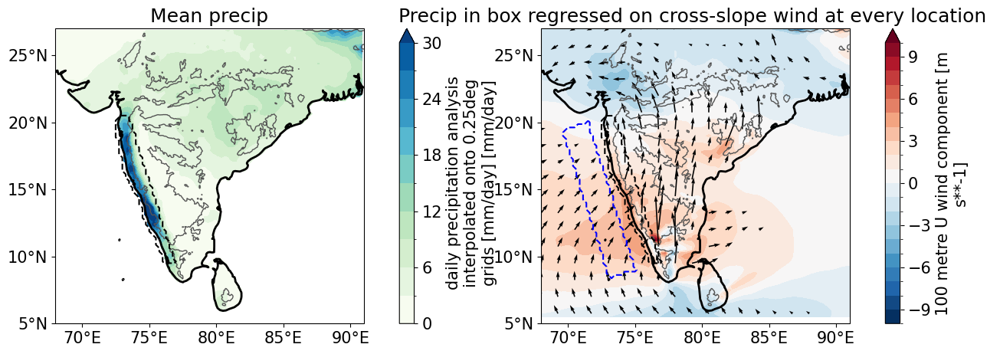

In [71]:
plot_regs(Ghats,APHRODITE,
          e5_100u_jja_yearly,
          e5_100v_jja_yearly,
          APHRODITE.precip_jja_yearly,typ=1)

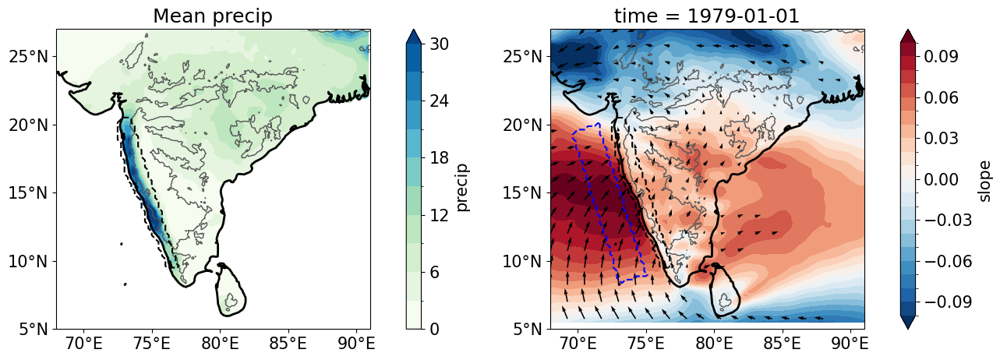

In [21]:
plot_regs(Ghats,APHRODITE,
          e5_100u_jja_yearly,
          e5_100v_jja_yearly,
          APHRODITE.precip_jja_yearly,typ=3)

/global/common/software/m3310/conda/xrdask.2024.03.qn/lib/python3.11/site-packages/xarray/core/nputils.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)


P  sensitivity: 15.1 [4.5 - 21.3] % / (m/s)
P' sensitivity: 17.9 [5.3 - 25.0] % / (m/s) assuming fixed P0 = 3 mm/day


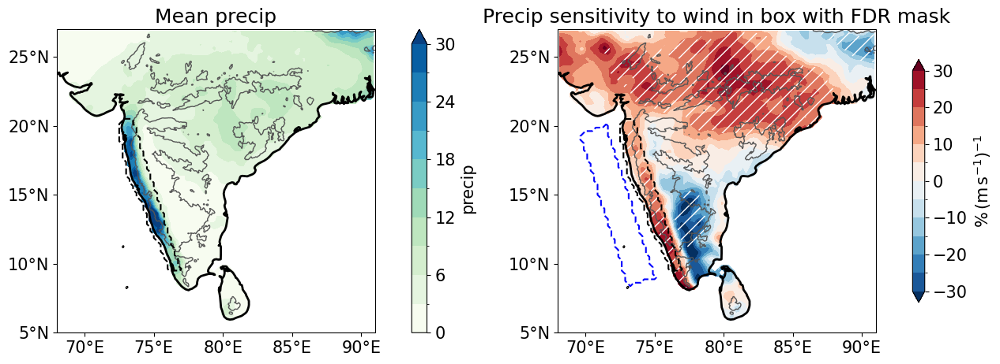

In [89]:
plot_regs(Ghats,APHRODITE,
          e5_100u_jja_yearly,
          e5_100v_jja_yearly,
          APHRODITE.precip_jja_yearly,typ=2)

P  sensitivity: 13.5 % / (m/s)
P' sensitivity: 16.3 % / (m/s) assuming fixed P0 = 3 mm/day
P  sensitivity: 13.5 [2.1 - 21.4] % / (m/s)
P' sensitivity: 16.3 [2.6 - 25.8] % / (m/s) assuming fixed P0 = 3 mm/day


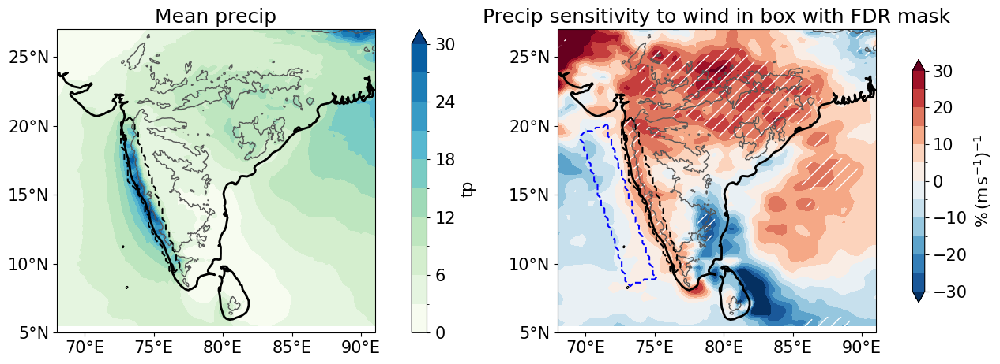

In [85]:
plot_regs(Ghats,ERA5,
          e5_100u_jja_yearly,
          e5_100v_jja_yearly,
          ERA5.precip_jja_yearly,typ=2)

P  sensitivity: 13.5 [2.4 - 21.4] % / (m/s)
P' sensitivity: 25.5 [15.2 - 32.8] % / (m/s) calculating P0 200-400km upstream


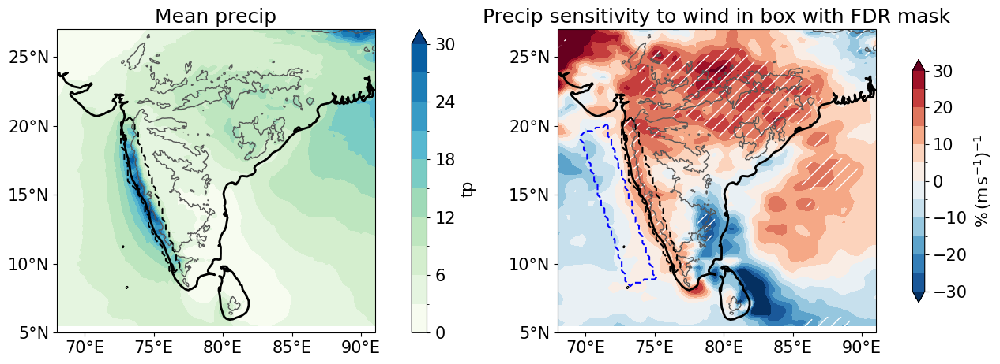

In [88]:
plot_regs(Ghats,ERA5,
          e5_100u_jja_yearly,
          e5_100v_jja_yearly,
          ERA5.precip_jja_yearly,typ=2,subtract_ups=True)

# Myanmar

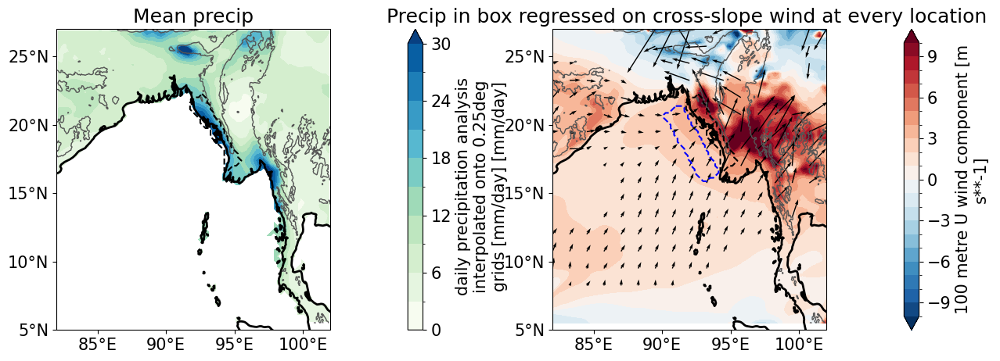

In [75]:
plot_regs(Myanmar,APHRODITE,
          e5_100u_jja_yearly,
          e5_100v_jja_yearly,
          APHRODITE.precip_jja_yearly,typ=1)

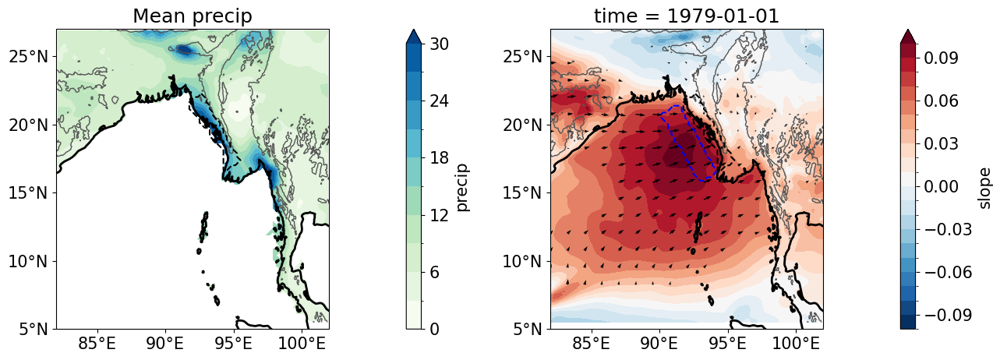

In [22]:
plot_regs(Myanmar,APHRODITE,
          e5_100u_jja_yearly,
          e5_100v_jja_yearly,
          APHRODITE.precip_jja_yearly,typ=3)

/global/common/software/m3310/conda/xrdask.2024.03.qn/lib/python3.11/site-packages/xarray/core/nputils.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)


P  sensitivity: 14.5 [9.9 - 18.9] % / (m/s)
P' sensitivity: 19.7 [13.5 - 25.9] % / (m/s) assuming fixed P0 = 6 mm/day


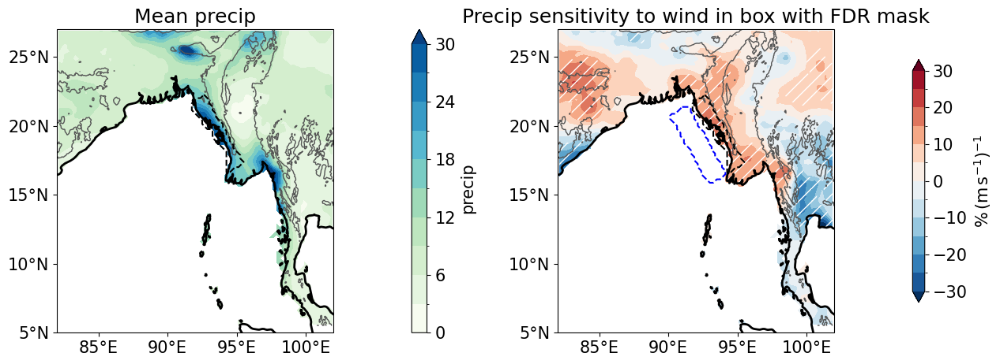

In [90]:
plot_regs(Myanmar,APHRODITE,
          e5_100u_jja_yearly,
          e5_100v_jja_yearly,
          APHRODITE.precip_jja_yearly,typ=2)

P  sensitivity: 18.4 [14.3 - 23.3] % / (m/s)
P' sensitivity: 25.0 [19.5 - 31.6] % / (m/s) assuming fixed P0 = 6 mm/day


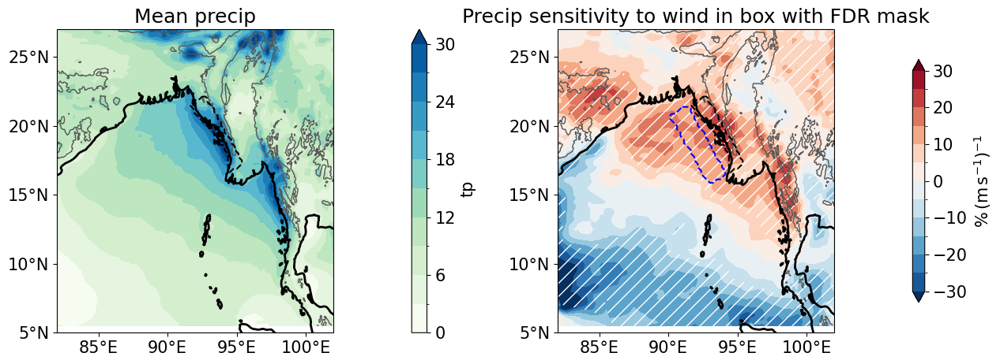

In [92]:
plot_regs(Myanmar,ERA5,
          e5_100u_jja_yearly,
          e5_100v_jja_yearly,
          ERA5.precip_jja_yearly,typ=2)

P  sensitivity: 18.4 [14.4 - 23.5] % / (m/s)
P' sensitivity: 32.8 [21.6 - 46.6] % / (m/s) calculating P0 200-400km upstream


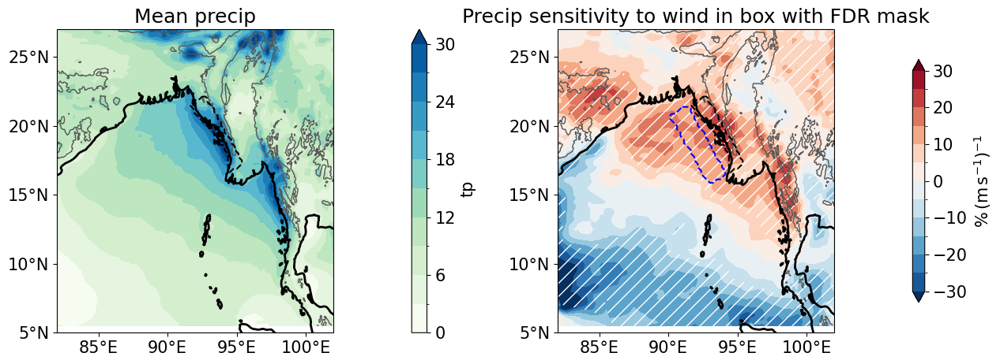

In [93]:
plot_regs(Myanmar,ERA5,
          e5_100u_jja_yearly,
          e5_100v_jja_yearly,
          ERA5.precip_jja_yearly,typ=2,subtract_ups=True)

# Vietnam

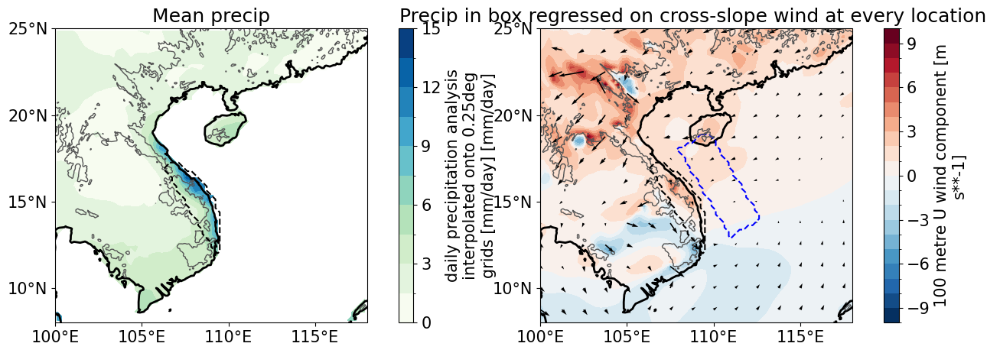

In [83]:
plot_regs(Vietnam,APHRODITE,
          e5_100u_ond_yearly,
          e5_100v_ond_yearly,
          APHRODITE.precip_ond_yearly,precip_mag=15,typ=1)

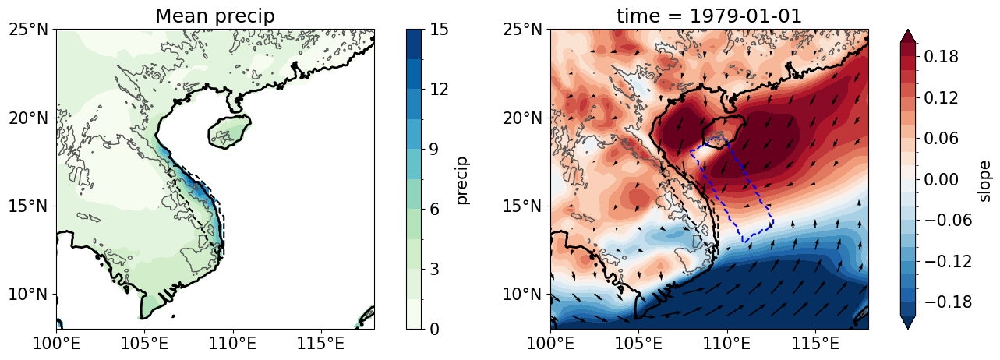

In [26]:
plot_regs(Vietnam,APHRODITE,
          e5_100u_ond_yearly,
          e5_100v_ond_yearly,
          APHRODITE.precip_ond_yearly,precip_mag=15,typ=3,regmag=0.2)

/global/common/software/m3310/conda/xrdask.2024.03.qn/lib/python3.11/site-packages/xarray/core/nputils.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)


P  sensitivity: 14.5 [5.3 - 25.1] % / (m/s)
P' sensitivity: 34.2 [12.4 - 59.0] % / (m/s) assuming fixed P0 = 4 mm/day


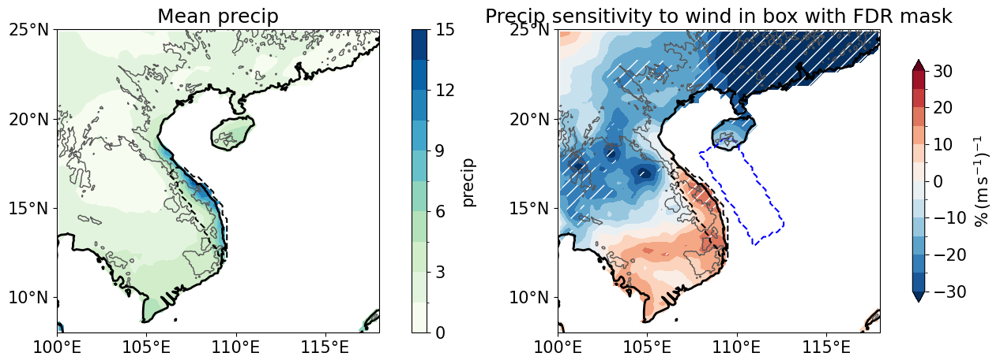

In [94]:
plot_regs(Vietnam,APHRODITE,
          e5_100u_ond_yearly,
          e5_100v_ond_yearly,
          APHRODITE.precip_ond_yearly,precip_mag=15,typ=2)

P  sensitivity: 15.9 % / (m/s)
P' sensitivity: 27.4 % / (m/s) assuming P0 = 4 mm/day


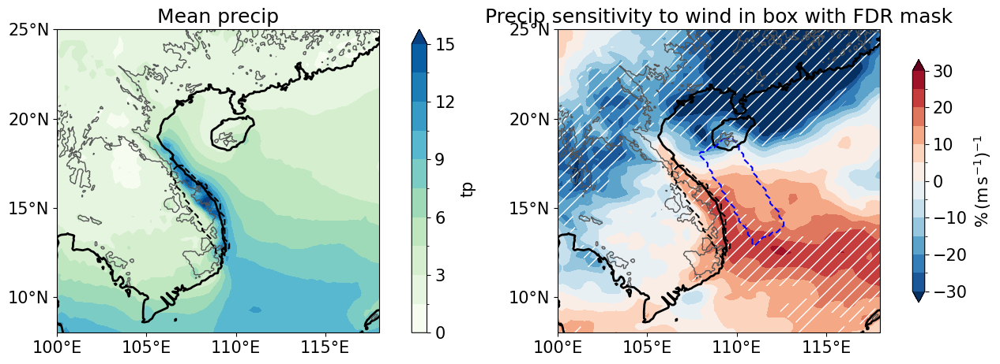

In [85]:
plot_regs(Vietnam,ERA5,
          e5_100u_ond_yearly,
          e5_100v_ond_yearly,
          ERA5.precip_ond_yearly,precip_mag=15,typ=2)

P  sensitivity: 15.6 [3.6 - 26.7] % / (m/s)
P' sensitivity: 30.9 [15.8 - 47.7] % / (m/s) calculating P0 200-400km upstream


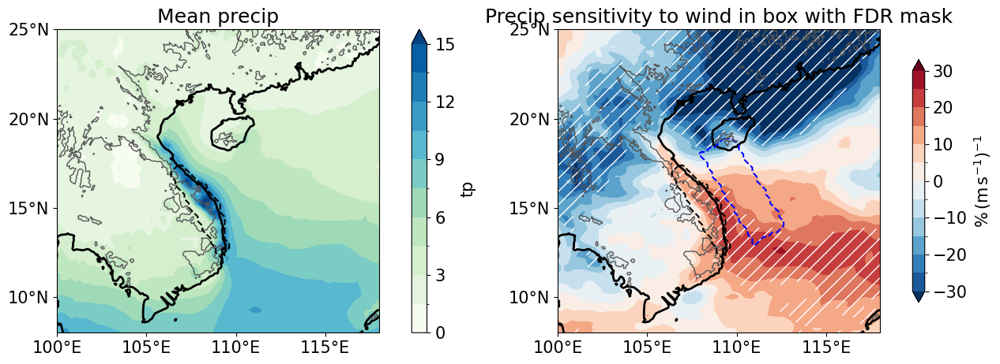

In [95]:
plot_regs(Vietnam,ERA5,
          e5_100u_ond_yearly,
          e5_100v_ond_yearly,
          ERA5.precip_ond_yearly,precip_mag=15,typ=2,subtract_ups=True)

# Malaysia

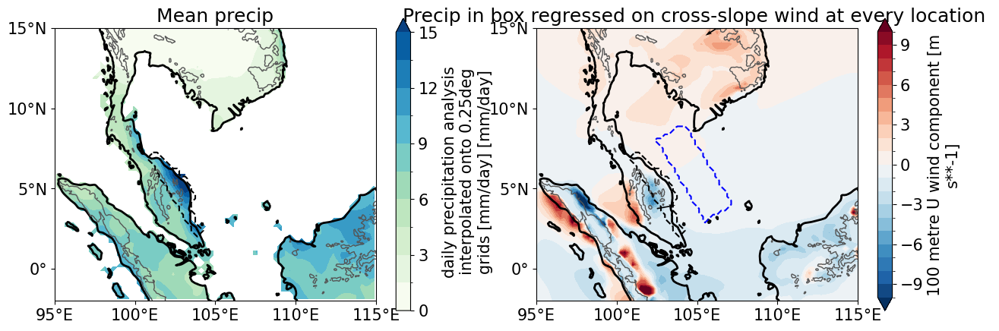

In [86]:
plot_regs(Malaysia,APHRODITE,
          e5_100u_nd_yearly,
          e5_100v_nd_yearly,
          APHRODITE.precip_nd_yearly,precip_mag=15,typ=1)

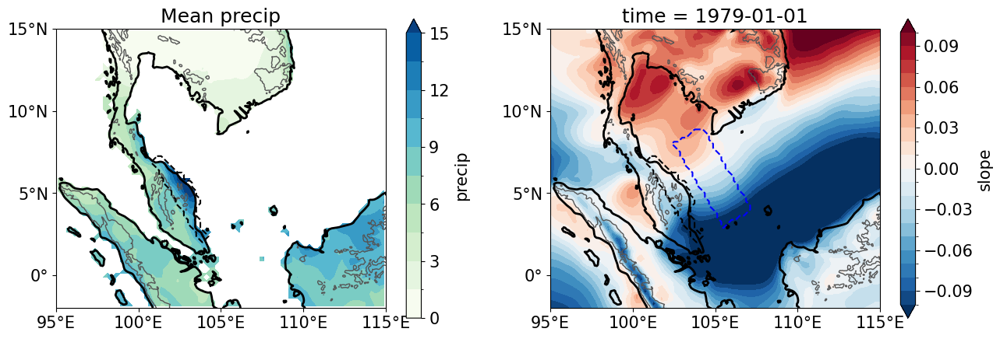

In [29]:
plot_regs(Malaysia,APHRODITE,
          e5_100u_nd_yearly,
          e5_100v_nd_yearly,
          APHRODITE.precip_nd_yearly,precip_mag=15,typ=3)

/global/common/software/m3310/conda/xrdask.2024.03.qn/lib/python3.11/site-packages/xarray/core/nputils.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)


P  sensitivity: -1.8 [-8.0 - 4.1] % / (m/s)
P' sensitivity: -2.8 [-12.3 - 6.2] % / (m/s) assuming fixed P0 = 4 mm/day


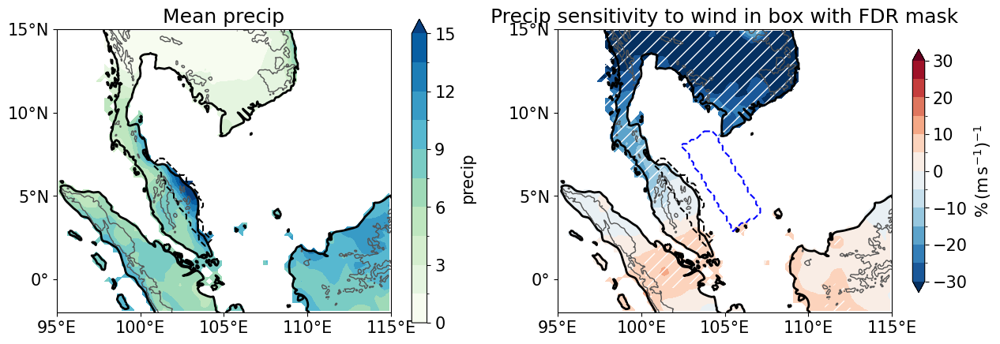

In [96]:
plot_regs(Malaysia,APHRODITE,
          e5_100u_nd_yearly,
          e5_100v_nd_yearly,
          APHRODITE.precip_nd_yearly,precip_mag=15,typ=2)

P  sensitivity: -1.1 [-6.6 - 4.9] % / (m/s)
P' sensitivity: -1.7 [-10.2 - 7.5] % / (m/s) assuming fixed P0 = 4 mm/day


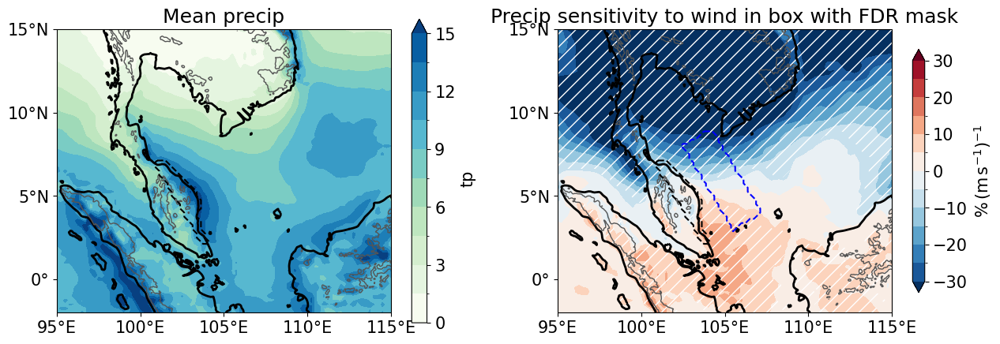

In [97]:
plot_regs(Malaysia,ERA5,
          e5_100u_nd_yearly,
          e5_100v_nd_yearly,
          ERA5.precip_nd_yearly,precip_mag=15,typ=2)

P  sensitivity: -1.1 [-6.7 - 4.8] % / (m/s)
P' sensitivity: 20.9 [3.8 - 38.6] % / (m/s) calculating P0 200-400km upstream


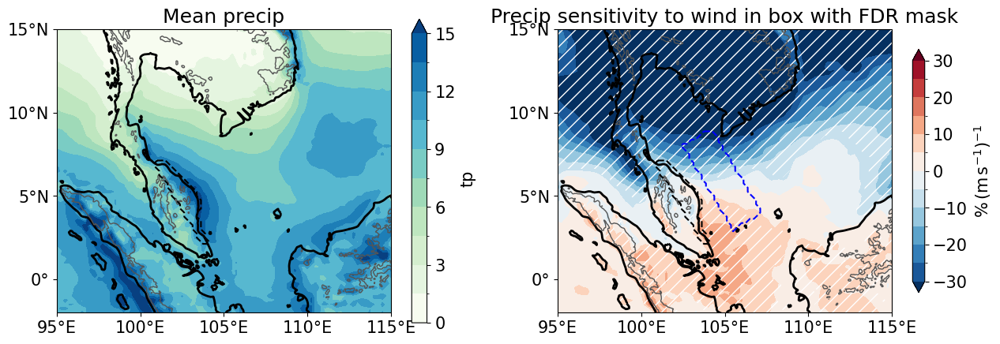

In [98]:
plot_regs(Malaysia,ERA5,
          e5_100u_nd_yearly,
          e5_100v_nd_yearly,
          ERA5.precip_nd_yearly,precip_mag=15,typ=2,subtract_ups=True)

# Philippines

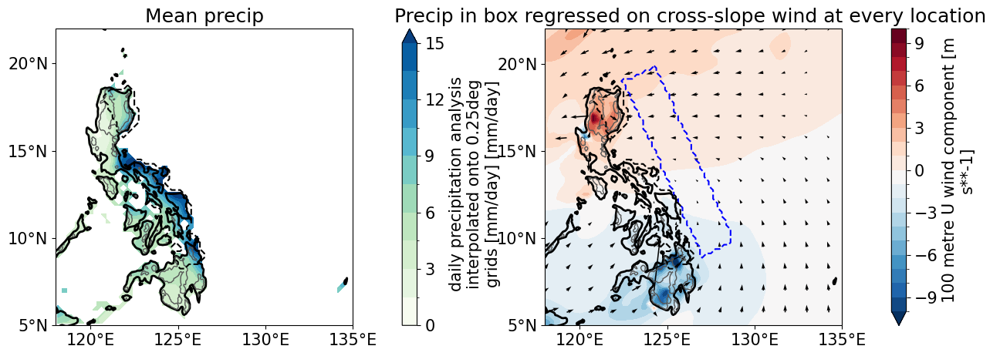

In [89]:
plot_regs(Philippines,APHRODITE,
          e5_100u_nd_yearly,
          e5_100v_nd_yearly,
          APHRODITE.precip_nd_yearly,precip_mag=15,typ=1)

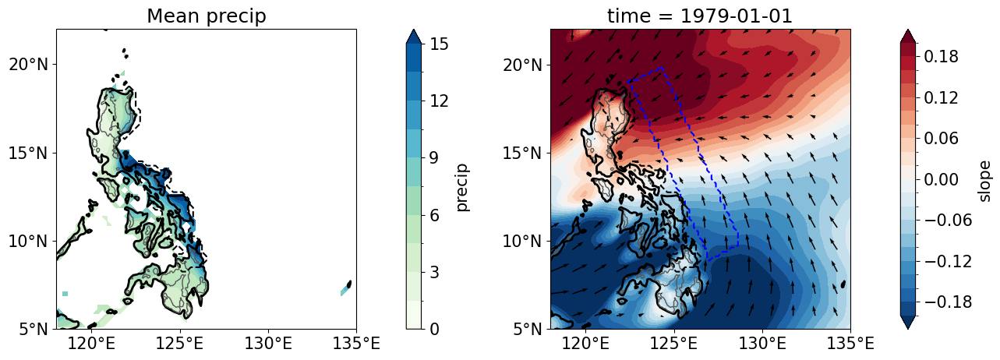

In [31]:
plot_regs(Philippines,APHRODITE,
          e5_100u_nd_yearly,
          e5_100v_nd_yearly,
          APHRODITE.precip_nd_yearly,precip_mag=15,typ=3,regmag=0.2)

/global/common/software/m3310/conda/xrdask.2024.03.qn/lib/python3.11/site-packages/xarray/core/nputils.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)


P  sensitivity: 4.1 [-5.5 - 12.7] % / (m/s)
P' sensitivity: -106.7 [-1412.6 - 1121.8] % / (m/s) assuming fixed P0 = 10 mm/day


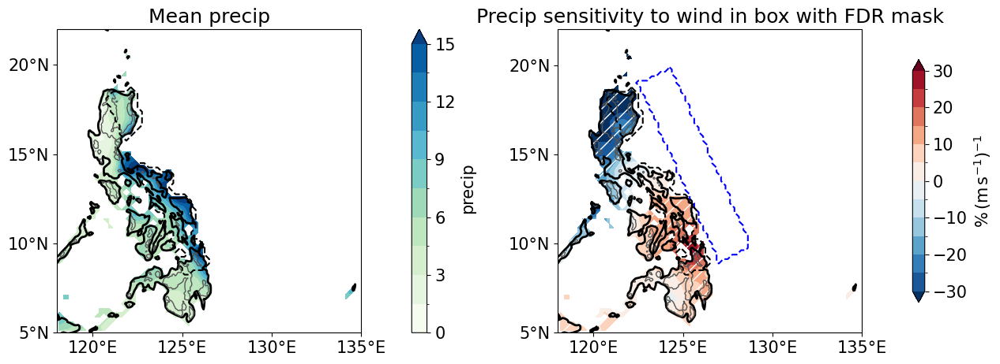

In [99]:
plot_regs(Philippines,APHRODITE,
          e5_100u_nd_yearly,
          e5_100v_nd_yearly,
          APHRODITE.precip_nd_yearly,precip_mag=15,typ=2)

P  sensitivity: 2.4 [-8.7 - 13.0] % / (m/s)
P' sensitivity: -10.1 [-61.5 - 37.3] % / (m/s) assuming fixed P0 = 10 mm/day


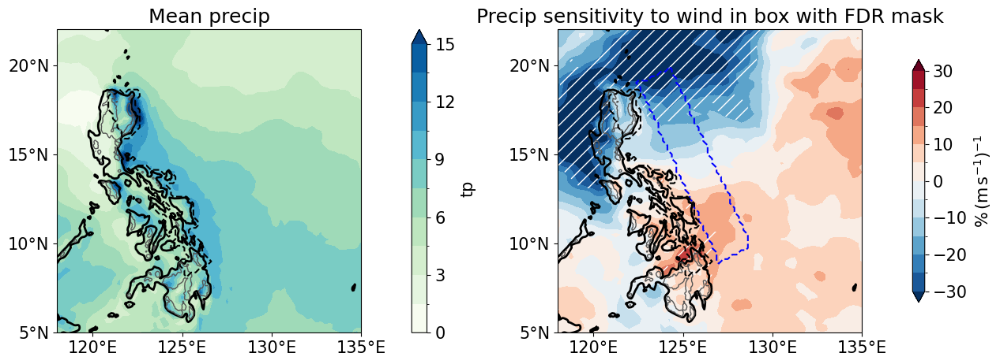

In [100]:
plot_regs(Philippines,ERA5,
          e5_100u_nd_yearly,
          e5_100v_nd_yearly,
          ERA5.precip_nd_yearly,precip_mag=15,typ=2)

P  sensitivity: 2.4 [-8.8 - 13.0] % / (m/s)
P' sensitivity: 26.0 [5.5 - 48.6] % / (m/s) calculating P0 200-400km upstream


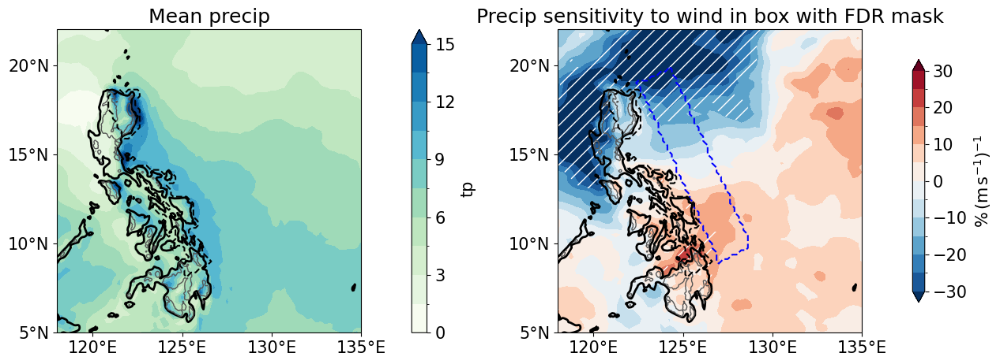

In [101]:
plot_regs(Philippines,ERA5,
          e5_100u_nd_yearly,
          e5_100v_nd_yearly,
          ERA5.precip_nd_yearly,precip_mag=15,typ=2,subtract_ups=True)

# EOF analysis

In [59]:
import xeofs as xe


In [60]:
def eof(box_region,pr,u,v):
    precip = sel_box(pr,box_region)
    u_sub = sel_box(u,box_region)
    v_sub = sel_box(v,box_region)
    
    precip = precip-precip.mean('year')
    
    model = xe.models.EOF(n_modes=4)
    model.fit(precip.fillna(0.), dim='year')
    components = model.components()
    scores = model.scores()
    var = model.explained_variance_ratio()
    
    fig,axs=plt.subplots(2,2,figsize=(18,12),subplot_kw={'projection':ccrs.PlateCarree()})
    axs=axs.reshape(-1)
    
    for i in range(4):
        ax=axs[i]
        mode_nb = i+1
        components.sel(mode=mode_nb).plot.contourf(ax=ax,
                       transform=ccrs.PlateCarree(),
                       levels=21)
                                        
        smooth(sel_box(topo_hires,box_region)).plot.contour(ax=ax,levels=[500.],colors='#555555',linewidths=[1.])
        
        ureg = linregress_xr(scores.sel(mode=mode_nb),u_sub,dim='year')
        vreg = linregress_xr(scores.sel(mode=mode_nb),v_sub,dim='year')
        fdrfact = fdr_xr_2d(ureg.pvalue,0.1) + fdr_xr_2d(vreg.pvalue,0.1) >0
        u = ureg.slope /fdrfact;v=vreg.slope /fdrfact
        Q = add_wind(ax,u,v,color='k',width=0.004,scale=100,key=False)
        
        ax.coastlines(linewidth=2)
        ax.set_title("EOF%i - %i %%"%(mode_nb,100*var.sel(mode=mode_nb)))
        add_latlon(ax,box_region)

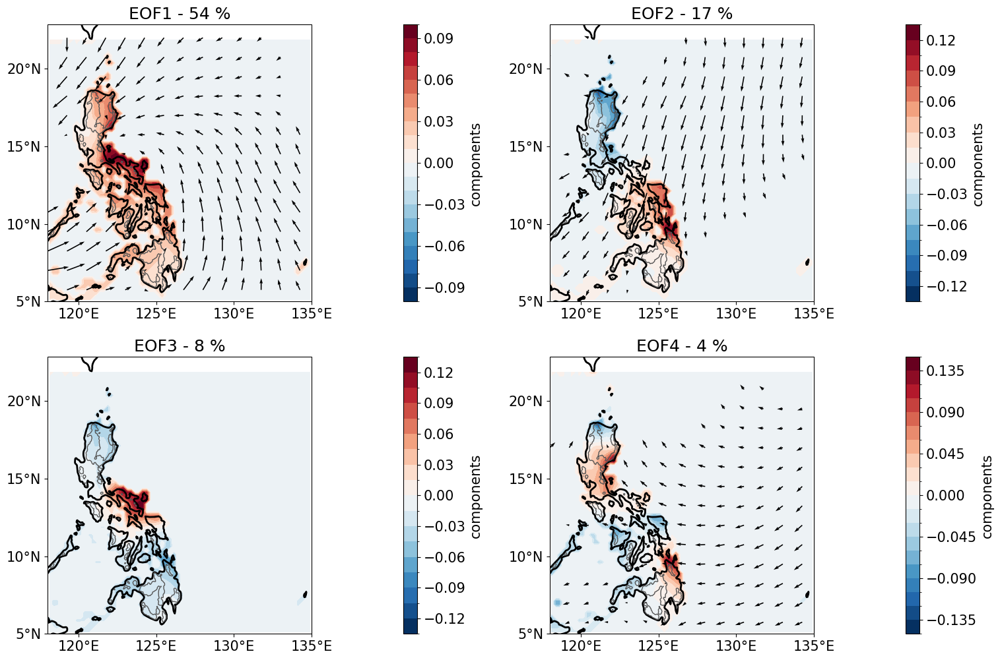

In [62]:
eof(Philippines.box,
    APHRODITE.precip_nd_yearly.sel(year=slice(1960,2015)),
    e5_100u_nd_yearly.sel(year=slice(1960,2015)),
    e5_100v_nd_yearly.sel(year=slice(1960,2015)),
   )

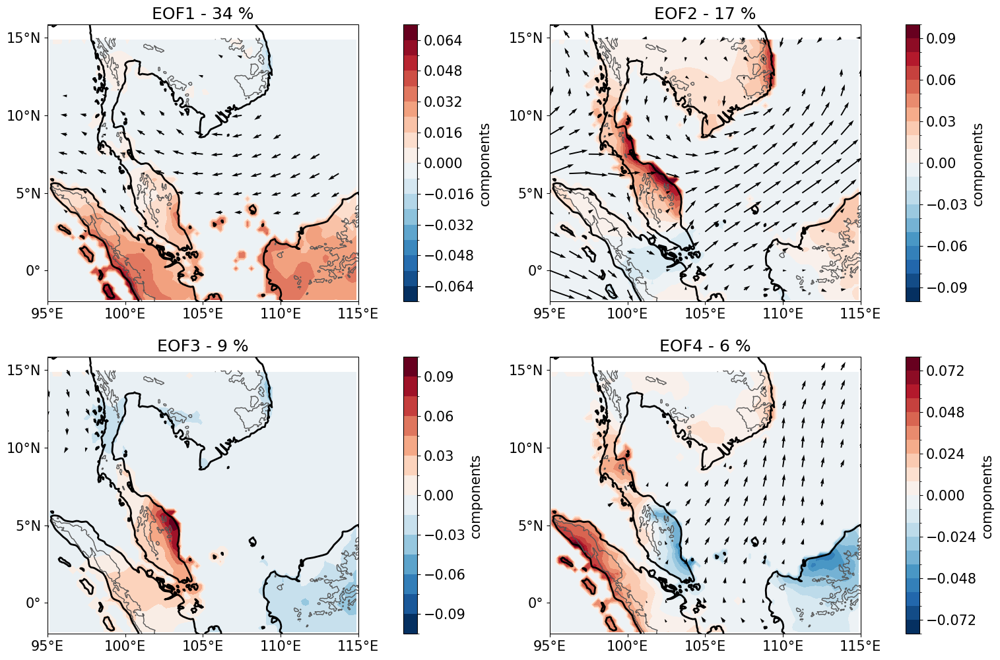

In [63]:
eof(Malaysia.box,
    APHRODITE.precip_nd_yearly.sel(year=slice(1960,2015)),
    e5_100u_nd_yearly.sel(year=slice(1960,2015)),
    e5_100v_nd_yearly.sel(year=slice(1960,2015)),
   )

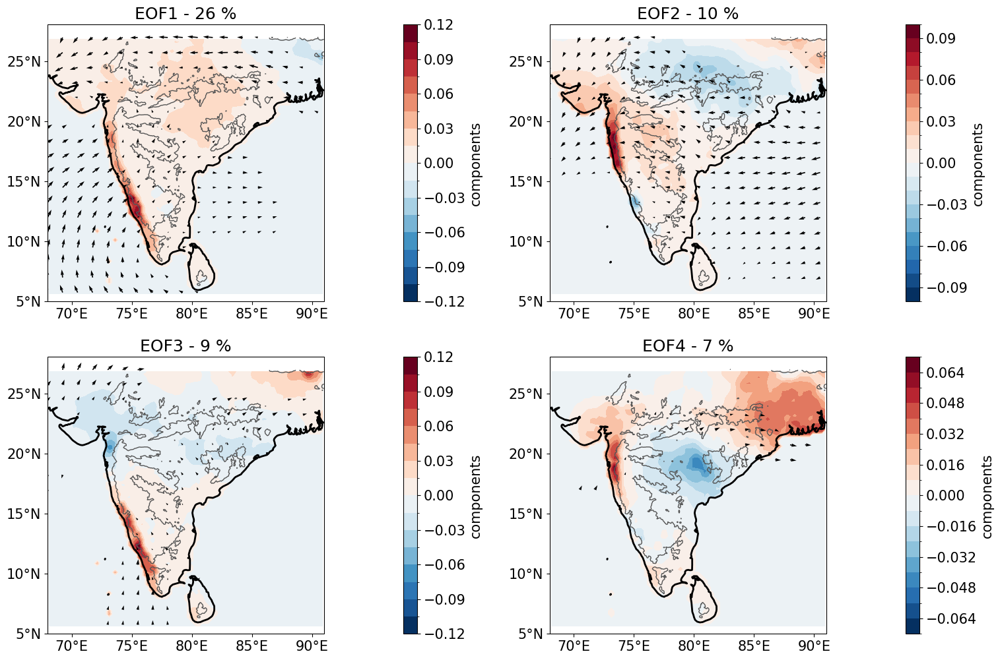

In [64]:
eof(Ghats.box,
    APHRODITE.precip_jja_yearly.sel(year=slice(1960,2015)),
    e5_100u_jja_yearly.sel(year=slice(1960,2015)),
    e5_100v_jja_yearly.sel(year=slice(1960,2015)),
   )

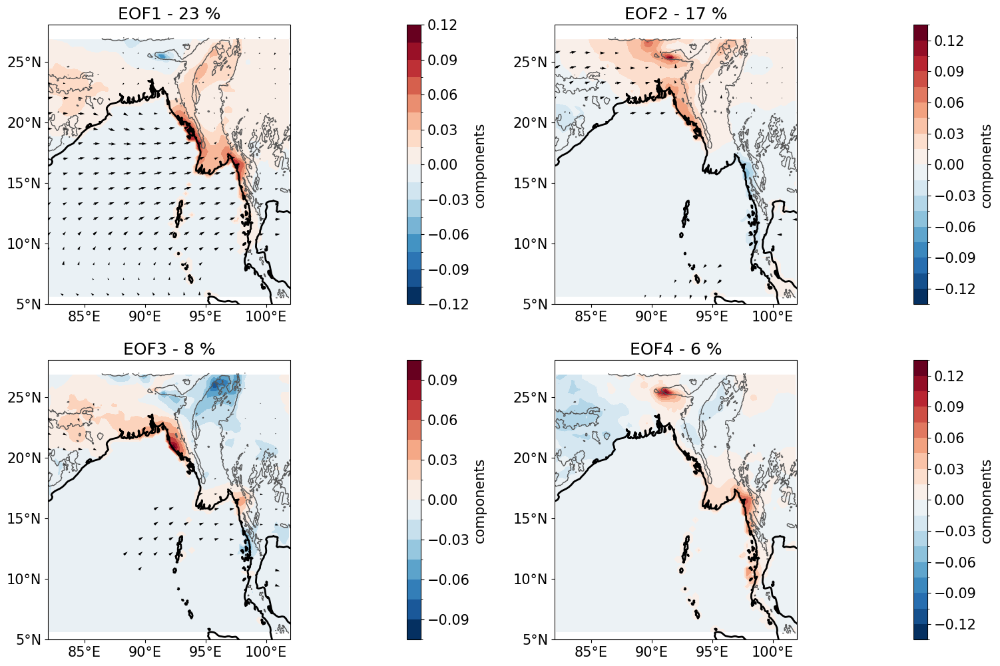

In [66]:
eof(Myanmar.box,
    APHRODITE.precip_jja_yearly.sel(year=slice(1960,2015)),
    e5_100u_jja_yearly.sel(year=slice(1960,2015)),
    e5_100v_jja_yearly.sel(year=slice(1960,2015)),
   )

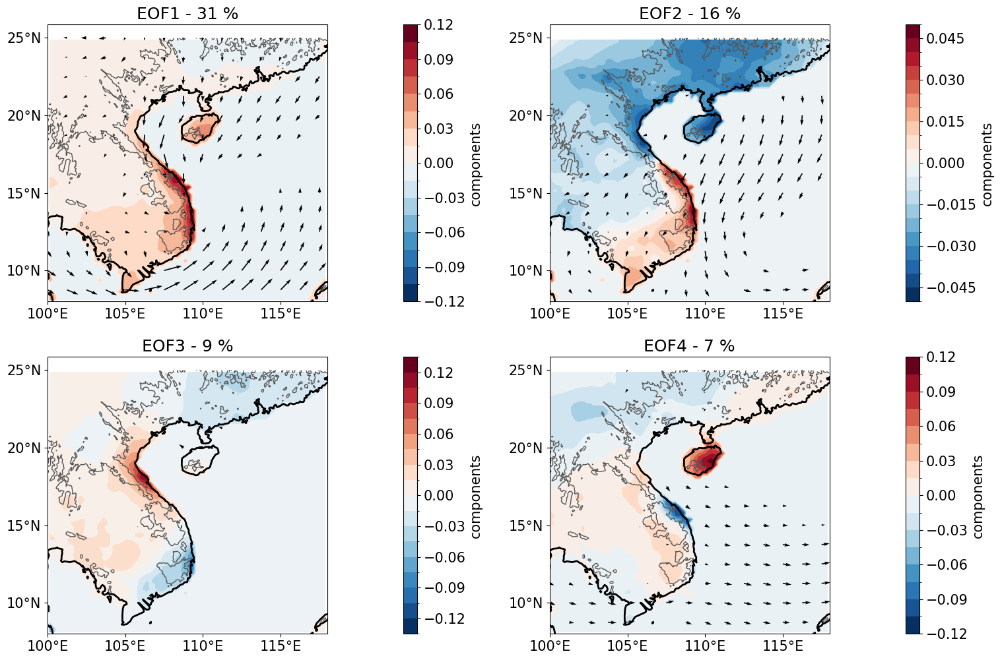

In [67]:
eof(Vietnam.box,
    APHRODITE.precip_ond_yearly.sel(year=slice(1960,2015)),
    e5_100u_ond_yearly.sel(year=slice(1960,2015)),
    e5_100v_ond_yearly.sel(year=slice(1960,2015)),
   )

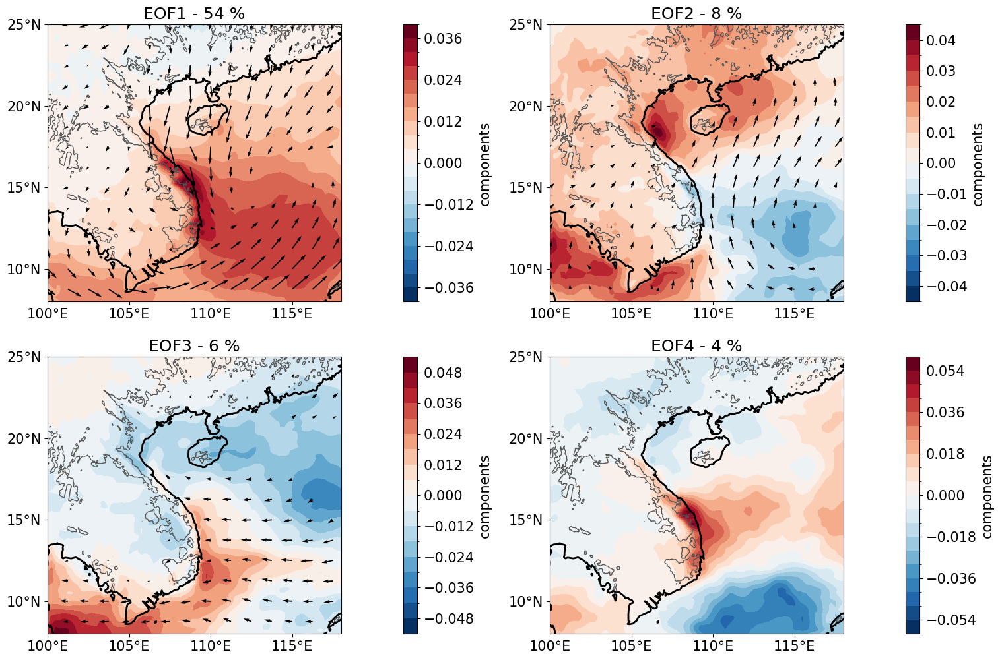

In [98]:
eof(Vietnam.box,
    ERA5.precip_ond_yearly.sel(year=slice(1960,2015)),
    e5_100u_ond_yearly.sel(year=slice(1960,2015)),
    e5_100v_ond_yearly.sel(year=slice(1960,2015)),
   )

# T,q regressions

In [104]:
e5_t_1950_1978 = xr.open_zarr("/pscratch/sd/q/qnicolas/temp/e5.monthly.128_130_t.1950-1978.zarr").t
e5_t_1979_2020 = xr.open_zarr("/pscratch/sd/q/qnicolas/temp/e5.monthly.128_130_t.1979-2020.zarr").T
e5_q_1950_1978 = xr.open_zarr("/pscratch/sd/q/qnicolas/temp/e5.monthly.128_133_q.1950-1978.zarr").q
e5_q_1979_2020 = xr.open_zarr("/pscratch/sd/q/qnicolas/temp/e5.monthly.128_133_q.1979-2020.zarr").Q
e5_t_monthly = xr.concat((e5_t_1950_1978,e5_t_1979_2020),dim='time').sel(time=slice("1960-01-01","2015-12-31"))
e5_q_monthly = xr.concat((e5_q_1950_1978,e5_q_1979_2020),dim='time').sel(time=slice("1960-01-01","2015-12-31"))

In [105]:
e5_t_jja_yearly = sel_box_months(e5_t_monthly,box = box, months=[6,7,8]   ).groupby('time.year').mean()
e5_t_ond_yearly = sel_box_months(e5_t_monthly,box = box, months=[10,11,12]).groupby('time.year').mean()
e5_t_nd_yearly  = sel_box_months(e5_t_monthly,box = box, months=[11,12]   ).groupby('time.year').mean()

e5_q_jja_yearly = sel_box_months(e5_q_monthly,box = box, months=[6,7,8]   ).groupby('time.year').mean()
e5_q_ond_yearly = sel_box_months(e5_q_monthly,box = box, months=[10,11,12]).groupby('time.year').mean()
e5_q_nd_yearly  = sel_box_months(e5_q_monthly,box = box, months=[11,12]   ).groupby('time.year').mean()

In [109]:
def plot_tqregs(MR,dataset,u100,v100,t,q,precip,ax=None,close=True):
    ### DATA
    box_region = MR.box
    rect_region = MR.tilted_rect
    angle = MR.angle
    mask_region = sel_box(dataset.region_masks[MR.name],box_region)
    
    u100 = sel_box(u100.sel(year=slice(1960,2015)),box_region)
    v100 = sel_box(v100.sel(year=slice(1960,2015)),box_region)
    precip = sel_box(precip.sel(year=slice(1960,2015)),box_region)
    crossslopeu = crossslopeflow(u100,v100,angle)
    mask_wind = tilted_rect(u100,*rect_region,True)
    
    if close:
        mask_upstream = mask_wind
    else:
        mask_upstream = tilted_rect_distance(t,*rect_region[:-1],-2,-4)
    mask_region_e5 = ERA5.region_masks[MR.name]
        
    precip_ts = spatial_mean(precip,mask = mask_region)
    wind_ts = spatial_mean(crossslopeu,mask = mask_wind)
    
    if ax is None:
        fig,ax=plt.subplots(1,1,figsize=(5,7))
    
    t_tz = spatial_mean(t,mask = mask_upstream).load()
    q_tz = 2.5e3*spatial_mean(q,mask = mask_upstream).load()
    t_tz_above = spatial_mean(t,mask = mask_region_e5).load()
    q_tz_above = 2.5e3*spatial_mean(q,mask = mask_region_e5).load()
    
    for ta,qa,c0,c1 in [(t_tz,q_tz,'C0','C1'),(t_tz_above-t_tz,q_tz_above-q_tz,'C2','C3')]:
        t_reg = linregress_xr(wind_ts,ta,dim='year')
        q_reg = linregress_xr(wind_ts,qa,dim='year')
        ax.plot(t_reg.slope,t.level,label='T',color=c0)
        ax.plot(q_reg.slope,t.level,label='q',color=c1)
        ax.fill_betweenx(t.level,t_reg.slope - t_reg.slope_sterr, t_reg.slope + t_reg.slope_sterr, color=c0,alpha=0.2)
        ax.fill_betweenx(t.level,q_reg.slope - q_reg.slope_sterr, q_reg.slope + q_reg.slope_sterr, color=c1,alpha=0.2)
    
    ax.set_ylim(1010,10)
    ax.set_xlim(-0.7,0.7)
    ax.grid()
    ax.legend()
    ax.set_title("upstream T/q regressed on \norog precip - %s"%MR.name,fontsize=15)

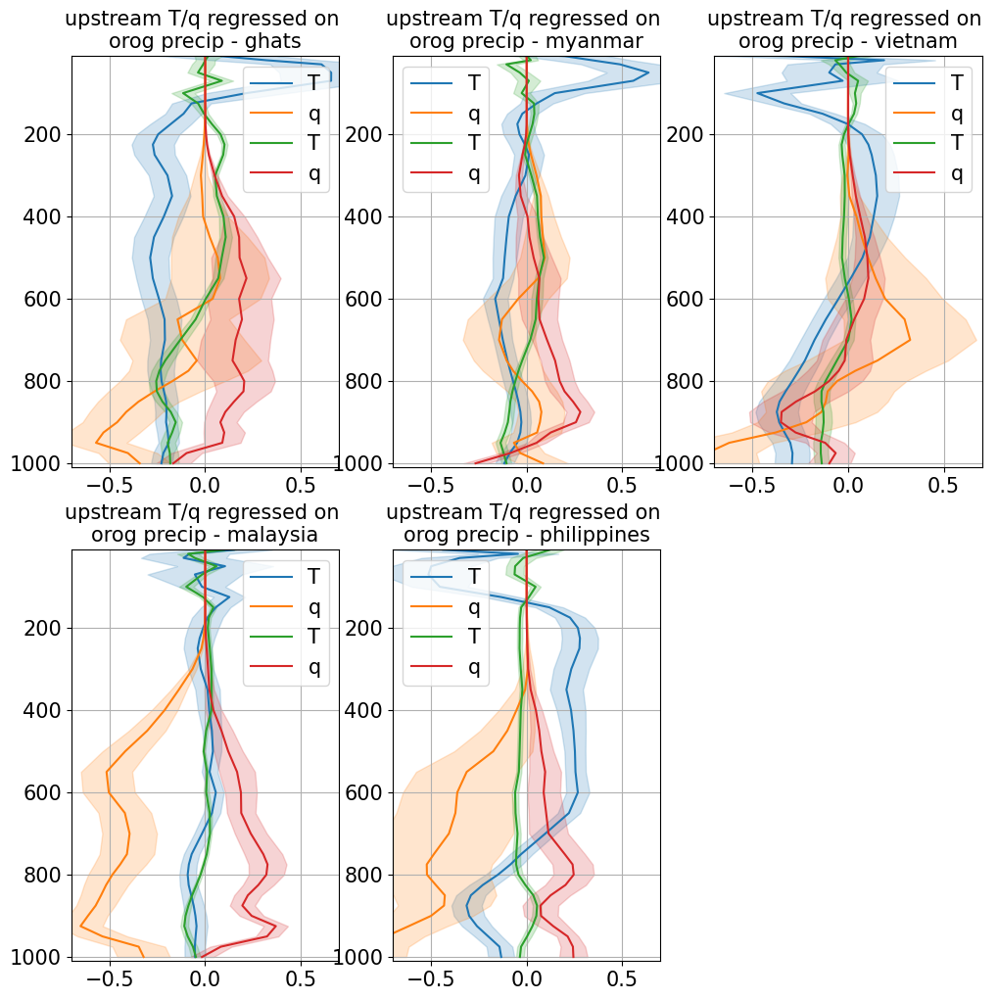

In [110]:
_,axs = plt.subplots(2,3,figsize=(12,12)); axs=axs.reshape(-1)
plot_tqregs(Ghats,APHRODITE,
            e5_100u_jja_yearly,
            e5_100v_jja_yearly,
            e5_t_jja_yearly,
            e5_q_jja_yearly,
            APHRODITE.precip_jja_yearly,ax=axs[0],close=False)
plot_tqregs(Myanmar,APHRODITE,
            e5_100u_jja_yearly,
            e5_100v_jja_yearly,
            e5_t_jja_yearly,
            e5_q_jja_yearly,
            APHRODITE.precip_jja_yearly,ax=axs[1],close=False)
plot_tqregs(Vietnam,APHRODITE,
            e5_100u_ond_yearly,
            e5_100v_ond_yearly,
            e5_t_ond_yearly,
            e5_q_ond_yearly,
            APHRODITE.precip_ond_yearly,ax=axs[2],close=False)
plot_tqregs(Malaysia,APHRODITE,
            e5_100u_nd_yearly,
            e5_100v_nd_yearly,
            e5_t_nd_yearly,
            e5_q_nd_yearly,
            APHRODITE.precip_nd_yearly,ax=axs[3],close=False)
plot_tqregs(Philippines,APHRODITE,
            e5_100u_nd_yearly,
            e5_100v_nd_yearly,
            e5_t_nd_yearly,
            e5_q_nd_yearly,
            APHRODITE.precip_nd_yearly,ax=axs[4],close=False)
axs[5].remove()

In [113]:
def plot_qreg(MR,dataset,u100,v100,q,ax=None):
    ### DATA
    box_region = MR.box
    rect_region = MR.tilted_rect
    angle = MR.angle
    mask_region = sel_box(dataset.region_masks[MR.name],box_region)
    
    u100 = sel_box(u100.sel(year=slice(1960,2015)),box_region)
    v100 = sel_box(v100.sel(year=slice(1960,2015)),box_region)
    crossslopeu = crossslopeflow(u100,v100,angle)
    mask_wind = tilted_rect(u100,*rect_region,True)
    mask_upstream = tilted_rect_distance(u100,*rect_region[:-1],-2,-4)
    mask_region_e5 = sel_box(ERA5.region_masks[MR.name],box_region)
    
    qL = sel_box(2.5e3*q.sel(level=slice(700,900)).mean('level'),box_region)
    wind_ts = spatial_mean(crossslopeu,mask = mask_wind)
    
    if ax is None:
        fig,axs=plt.subplots(1,2,figsize=(20,8),subplot_kw={'projection':ccrs.PlateCarree()})
    
    q_reg = linregress_xr_wCI(wind_ts,qL,dim='year')
    q_reg.slope.plot.contourf(ax=axs[1],levels=11,transform=ccrs.PlateCarree())
    qL.mean('year').plot.contourf(ax=axs[0],levels=11,transform=ccrs.PlateCarree())
    
    ureg = linregress_xr(wind_ts,u100,dim='year')
    vreg = linregress_xr(wind_ts,v100,dim='year')
    fdrfact = 1.#fdr_xr_2d(ureg.pvalue,0.1) + fdr_xr_2d(vreg.pvalue,0.1) >0
    u = ureg.slope /fdrfact;v=vreg.slope /fdrfact
    Q = add_wind(axs[0],u,v,color='w',width=0.004,scale=10,key=False)
    
    axs[1].coastlines()
    
    for ax in axs:
        mask_upstream .plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors='k',linestyles=['--']) 
        mask_wind     .plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors='b',linestyles=['--']) 
        mask_region_e5.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors='k',linestyles=['--']) 
    axs[0].set_title('Mean q_L, and wind regressed on upstream wind')
    axs[1].set_title('q_L regressed on upstream wind')

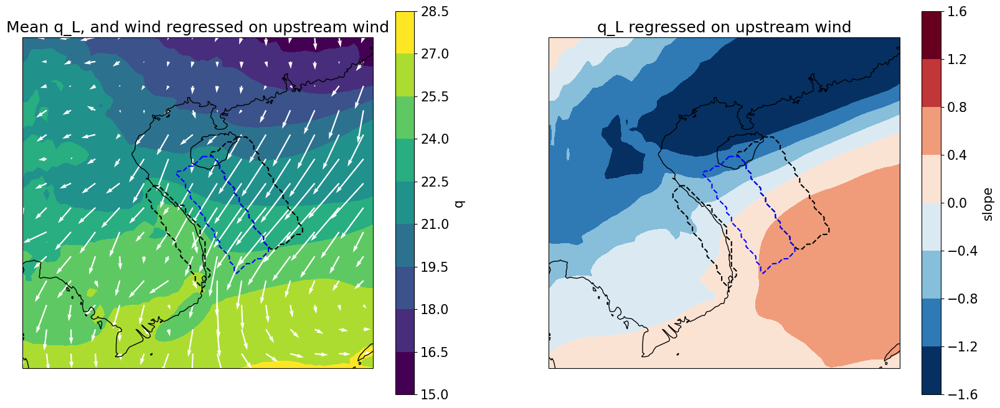

In [114]:
plot_qreg(Vietnam,APHRODITE,
          e5_100u_ond_yearly,
          e5_100v_ond_yearly,
          e5_q_ond_yearly)